## CSCE636 Deep Learning - Dr. Anxiao Jiang
- Changcheng Yuan
- UIN: 53500517

Check out the Jupyter notebooks for Chapter 10 at https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/chapter10_interpreting-what-convnets-learn.ipynb and Chapter 11 at https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/chapter11_image-segmentation.ipynb . Then:

1) Try the code on "Visualizing intermediate activations". Show the visualization result on a randomly selected image from the dogs-vs-cats dataset. 

2) Try the code on "Visualizing convnet filters". Show the visualization result for a randomly selected filter.

3) Try the code on "Visualizing heatmaps of class activation". Show the visualization result on a randomly selected image from the dogs-vs-cats dataset. 

4) Try the code on image segmentation. Show the segmentation result on a randomly selected image. 

First we load the dataset. Train the model to get the trained neural network so that we can inspect it later. 


In [24]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

inputs = keras.Input(shape=(180, 180, 3), name='image_input')
x = layers.Rescaling(1.0 / 255, name='rescaling')(inputs)
x = layers.Conv2D(32, 3, activation='relu', name='conv2d_11')(x)
x = layers.MaxPooling2D(2, name='max_pooling2d_6')(x)
x = layers.Conv2D(64, 3, activation='relu', name='conv2d_12')(x)
x = layers.MaxPooling2D(2, name='max_pooling2d_7')(x)
x = layers.Conv2D(128, 3, activation='relu', name='conv2d_13')(x)
x = layers.MaxPooling2D(2, name='max_pooling2d_8')(x)
x = layers.Conv2D(256, 3, activation='relu', name='conv2d_14')(x)
x = layers.MaxPooling2D(2, name='max_pooling2d_9')(x)
x = layers.Conv2D(512, 3, activation='relu', name='conv2d_15')(x)
x = layers.GlobalAveragePooling2D(name='global_average_pooling2d_3')(x)
x = layers.Dropout(0.5, name='dropout')(x)
outputs = layers.Dense(1, activation='sigmoid', name='dense_3')(x)

model = keras.Model(inputs, outputs, name='convnet_from_scratch_with_augmentation')
model.summary()

Model: "convnet_from_scratch_with_augmentation"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,569,089 (5.99 MB)

 Trainable params: 1,569,089 (5.99 MB)

 Non-trainable params: 0 (0.00 B)

In [32]:
# Train the model
import pathlib
import random

import tensorflow as tf

data_dir = pathlib.Path("../data/dogs-vs-cats/train")
max_images_per_class = 5000

cat_paths = sorted(str(p) for p in data_dir.glob("cat.*.jpg"))[:max_images_per_class]
dog_paths = sorted(str(p) for p in data_dir.glob("dog.*.jpg"))[:max_images_per_class]

all_paths = cat_paths + dog_paths
all_labels = [0] * len(cat_paths) + [1] * len(dog_paths)

if not all_paths:
    raise RuntimeError("No training images found. Make sure the Kaggle dataset is extracted under '../data/dogs-vs-cats/train'.")

combined = list(zip(all_paths, all_labels))
random.seed(1337)
random.shuffle(combined)
paths, labels = zip(*combined)

num_samples = len(paths)
train_end = int(num_samples * 0.7)
val_end = int(num_samples * 0.85)

train_paths, train_labels = paths[:train_end], labels[:train_end]
val_paths, val_labels = paths[train_end:val_end], labels[train_end:val_end]
test_paths, test_labels = paths[val_end:], labels[val_end:]

img_size = (180, 180)

def load_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, img_size)
    image = tf.cast(image, tf.float32)
    return image, tf.cast(label, tf.float32)

def make_dataset(paths, labels, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices((list(paths), list(labels)))
    if shuffle:
        ds = ds.shuffle(buffer_size=len(paths), reshuffle_each_iteration=True)
    ds = ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    return ds.batch(32).prefetch(tf.data.AUTOTUNE)

train_ds = make_dataset(train_paths, train_labels, shuffle=True)
val_ds = make_dataset(val_paths, val_labels)
test_ds = make_dataset(test_paths, test_labels)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", patience=5, restore_best_weights=True
    )
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=callbacks,
)

print("Evaluating on held-out test set...")
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.3f}")



Epoch 1/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step - accuracy: 0.5330 - loss: 0.6872 - val_accuracy: 0.6480 - val_loss: 0.6476
Epoch 2/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - accuracy: 0.6224 - loss: 0.6514 - val_accuracy: 0.6547 - val_loss: 0.6196
Epoch 3/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - accuracy: 0.6503 - loss: 0.6195 - val_accuracy: 0.6587 - val_loss: 0.6128
Epoch 4/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7004 - loss: 0.5834 - val_accuracy: 0.7207 - val_loss: 0.5683
Epoch 5/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7141 - loss: 0.5661 - val_accuracy: 0.7127 - val_loss: 0.5609
Epoch 6/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7277 - loss: 0.5552 - val_accuracy: 0.7373 - val_loss: 0.5267
Epoch 7/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7380 - loss: 0.5227 - val_accuracy: 0.7540 - val_loss: 0.5131
Epoch 8/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.7494 - loss: 0.5097 - va

img_tensor shape: (1, 180, 180, 3)


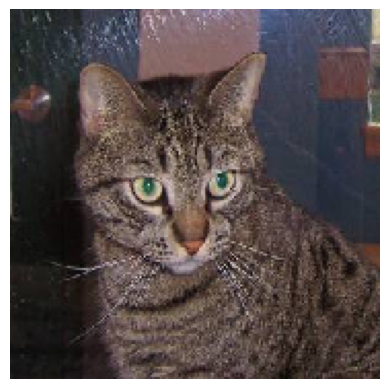

In [39]:
import keras
import numpy as np

img_path = "../data/dogs-vs-cats/train/cat.1.jpg"

# img_path = keras.utils.get_file(
#     fname="cat.jpg", origin="https://img-datasets.s3.amazonaws.com/cat.jpg"
# )

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

print("img_tensor shape:", img_tensor.shape)

import matplotlib.pyplot as plt

plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

## Q1

1) Try the code on "Visualizing intermediate activations". Show the visualization result on a randomly selected image from the dogs-vs-cats dataset. 

In [40]:
from keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
(1, 178, 178, 32)


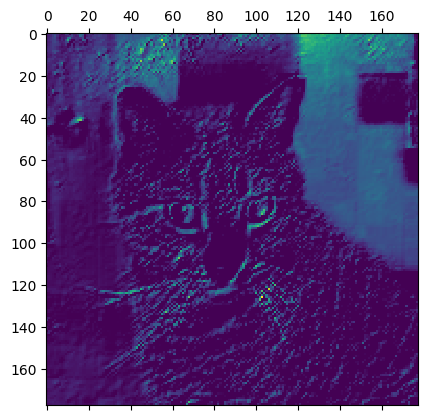

In [41]:
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 5], cmap="viridis")

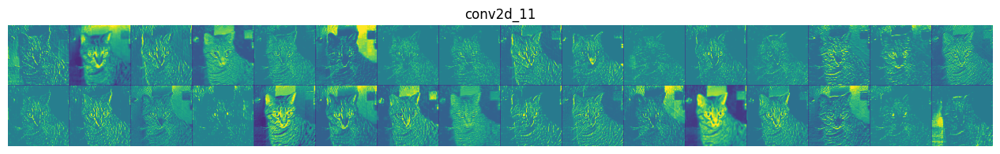

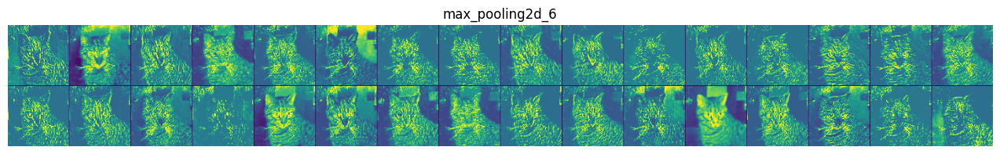

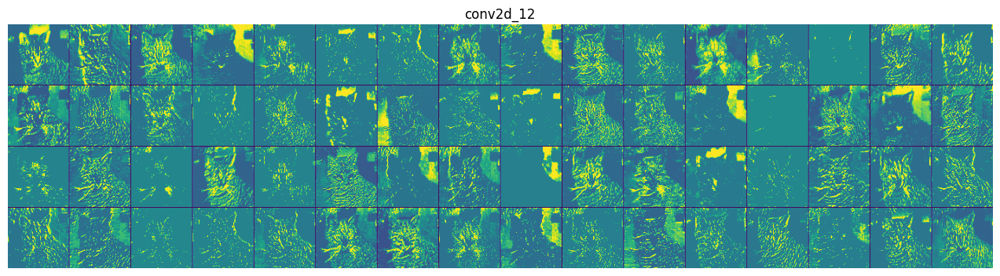

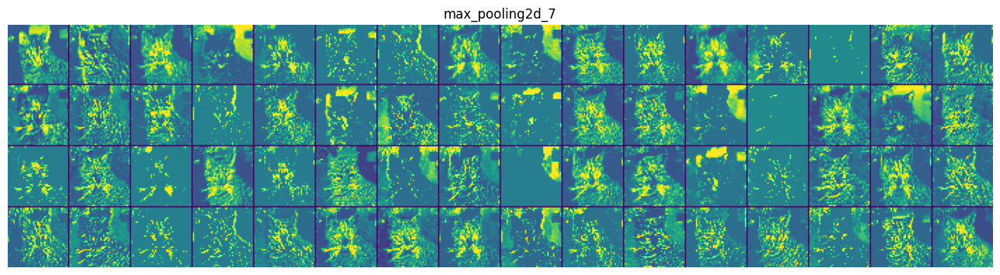

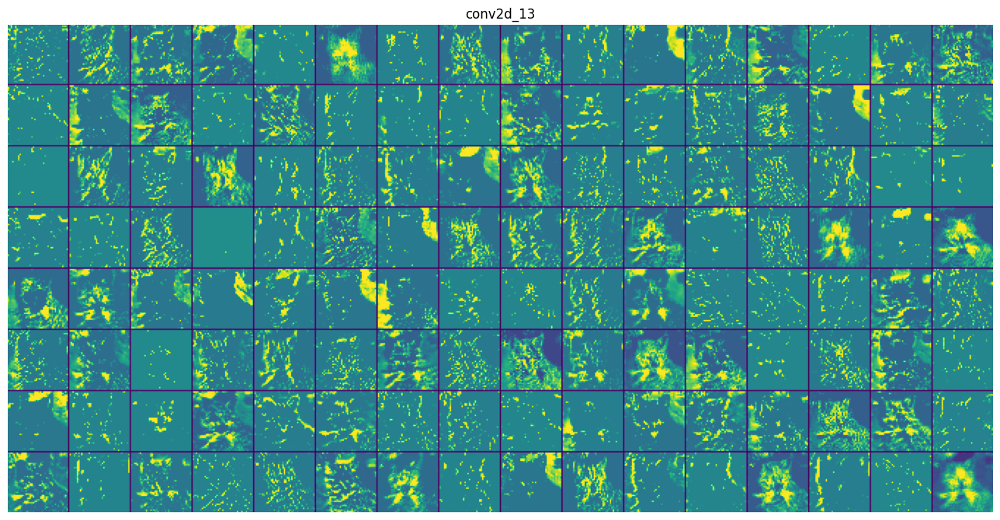

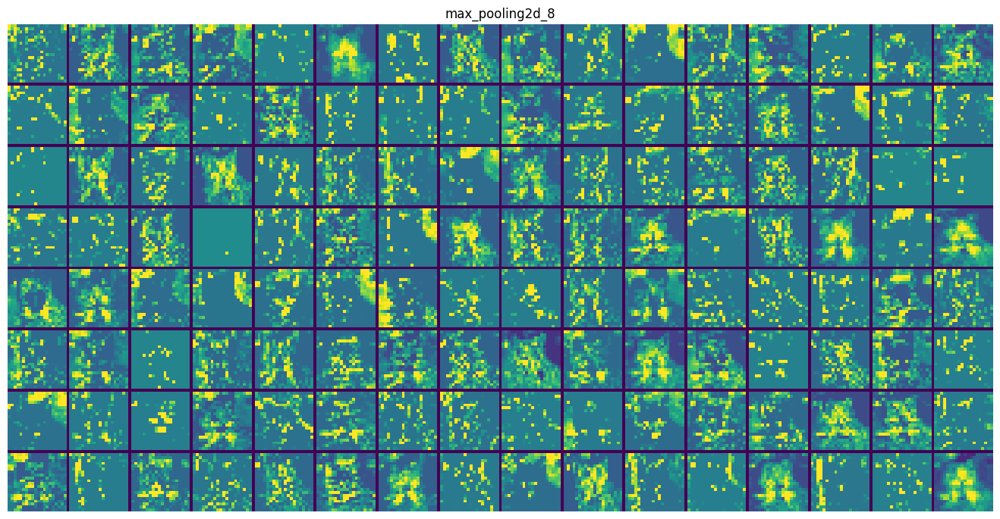

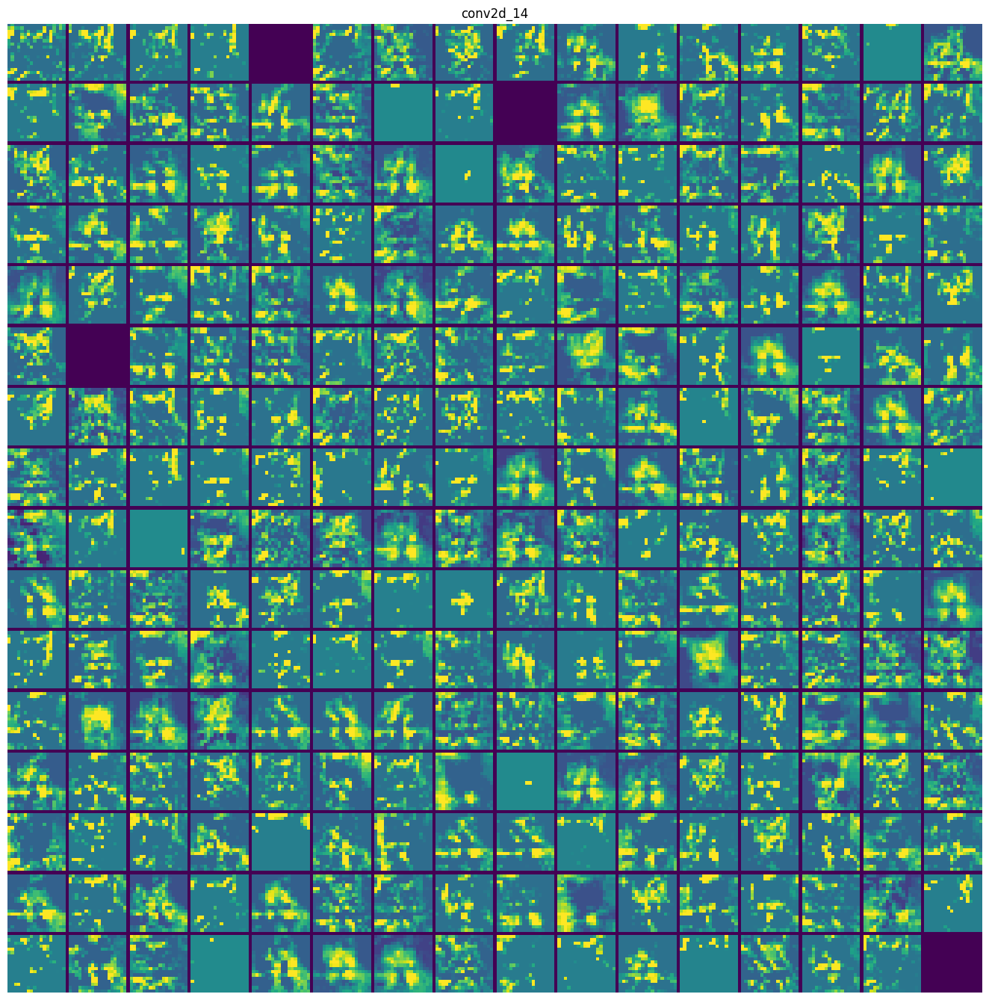

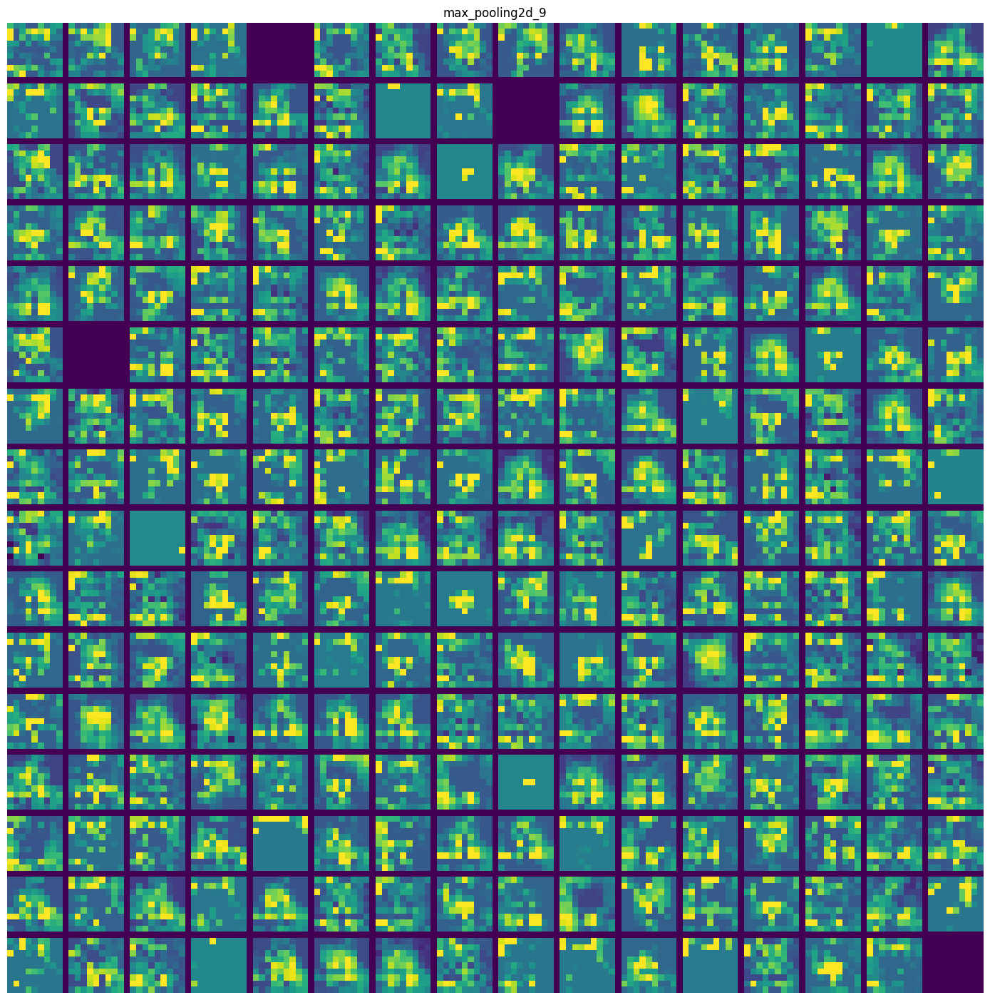

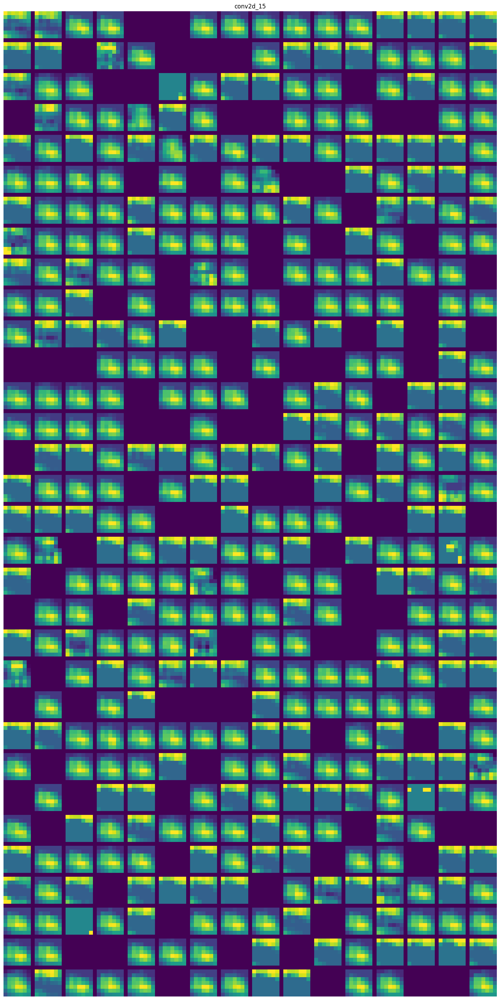

In [42]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(
        ((size + 1) * n_cols - 1, images_per_row * (size + 1) - 1)
    )
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1) : (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row,
            ] = channel_image
    scale = 1.0 / size
    plt.figure(
        figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0])
    )
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

## Q2

2) Try the code on "Visualizing convnet filters". Show the visualization result for a randomly selected filter.

In [47]:
from tensorflow import keras

input_shape = (180, 180, 3)
model = keras.applications.Xception(
    weights="imagenet",
    include_top=False,
    input_shape=input_shape,
    pooling="avg",  # optional; matches what keras_hub often does
)

preprocess = keras.applications.xception.preprocess_input
# or wrap it:
from tensorflow.keras import layers
preprocessor = keras.Sequential(
    [layers.Lambda(preprocess, name="xception_preprocess")],
    name="xception_preprocessor",
)

In [48]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)

block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d_4
block3_sepconv1
block3_sepconv2
conv2d_5
block4_sepconv1
block4_sepconv2
conv2d_6
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_7
block14_sepconv1
block14_sepconv2


In [61]:
layer_name = "block4_sepconv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

activation = feature_extractor(preprocessor(img_tensor))

In [62]:
from keras import ops

def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return ops.mean(filter_activation)

Implement gradient ascent so that we can see the image pixels that activate the neuron. 

In [63]:
import tensorflow as tf

@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = ops.normalize(grads)
    image += learning_rate * grads
    return image

In [64]:
img_width = 180
img_height = 180

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.0
    image = keras.random.uniform(
        minval=0.4, maxval=0.6, shape=(1, img_width, img_height, 3)
    )
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0]

def deprocess_image(image):
    image -= ops.mean(image)
    image /= ops.std(image)
    image *= 64
    image += 128
    image = ops.clip(image, 0, 255)
    image = image[25:-25, 25:-25, :]
    image = ops.cast(image, dtype="uint8")
    return ops.convert_to_numpy(image)

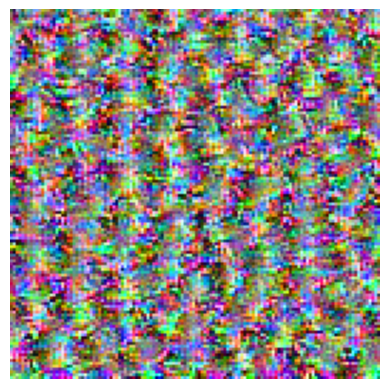

In [65]:
plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

In [66]:
all_images = []
for filter_index in range(64):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(generate_filter_pattern(filter_index))
    all_images.append(image)

margin = 5
n = 8
box_width = img_width - 25 * 2
box_height = img_height - 25 * 2
full_width = n * box_width + (n - 1) * margin
full_height = n * box_height + (n - 1) * margin
stitched_filters = np.zeros((full_width, full_height, 3))

for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            (box_width + margin) * i : (box_width + margin) * i + box_width,
            (box_height + margin) * j : (box_height + margin) * j + box_height,
            :,
        ] = image

keras.utils.save_img(f"filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

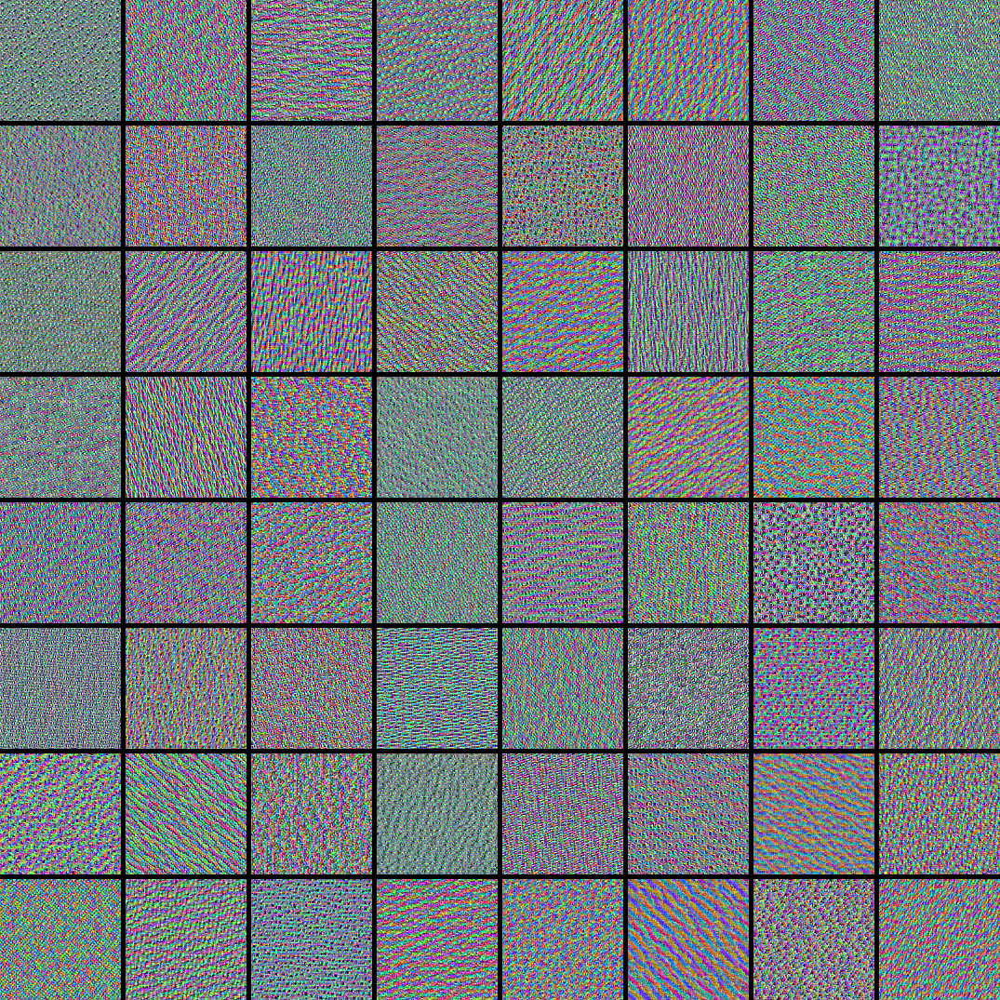

In [67]:
from IPython.display import Image, display
display(Image(filename="filters_for_layer_block3_sepconv1.png"))

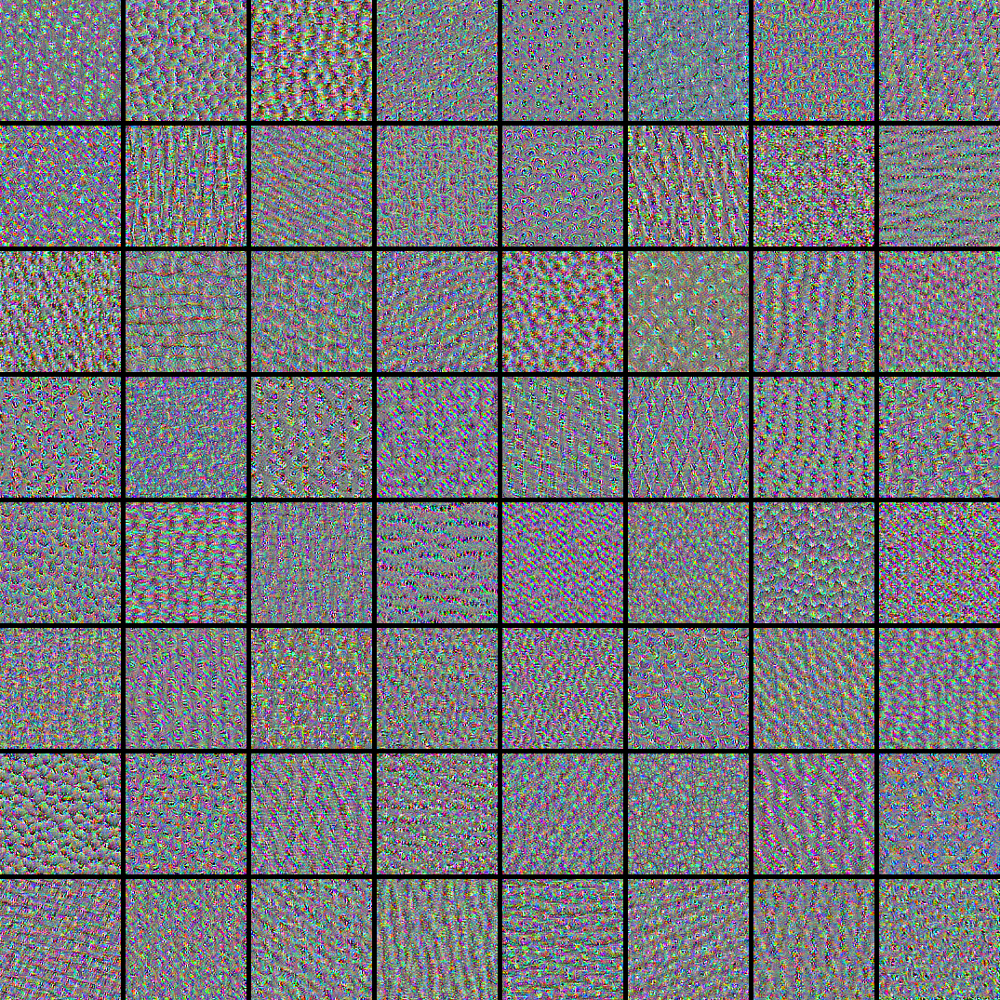

In [68]:
display(Image(filename="filters_for_layer_block4_sepconv1.png"))

## Q3

3) Try the code on "Visualizing heatmaps of class activation". Show the visualization result on a randomly selected image from the dogs-vs-cats dataset. 

In [80]:
img_path = keras.utils.get_file(
    fname="elephant.jpg",
    origin="https://img-datasets.s3.amazonaws.com/elephant.jpg",
)
img = keras.utils.load_img(img_path)

img = img.resize((299, 299))
img_array = keras.utils.img_to_array(img)[None, ...]
img_array = keras.applications.xception.preprocess_input(img_array)



In [81]:
preprocessor = keras.Sequential(
    [keras.layers.Lambda(keras.applications.xception.preprocess_input)],
    name="xception_preprocess",
)

model = keras.applications.Xception(
    weights="imagenet",
    include_top=True,          # keep the 1000-way classification head
    input_shape=(299, 299, 3), # resize inputs accordingly
    classes=1000,
    classifier_activation="softmax",
)
preds = model.predict(img_array)
preds.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


(1, 1000)

In [84]:
from tensorflow.keras.applications.imagenet_utils import decode_predictions
decode_predictions(preds)

np.argmax(preds[0])



386

In [87]:
img_array = preprocessor(img_array)

In [88]:
last_conv_layer_name = "block14_sepconv2_act"
last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

In [ ]:
classifier_input = last_conv_layer.output
x = classifier_input
for layer_name in ["avg_pool", "predictions"]:
    x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

ValueError: No such layer: pooler. Existing layers are: ['input_layer_6', 'block1_conv1', 'block1_conv1_bn', 'block1_conv1_act', 'block1_conv2', 'block1_conv2_bn', 'block1_conv2_act', 'block2_sepconv1', 'block2_sepconv1_bn', 'block2_sepconv2_act', 'block2_sepconv2', 'block2_sepconv2_bn', 'conv2d_20', 'block2_pool', 'batch_normalization_20', 'add_60', 'block3_sepconv1_act', 'block3_sepconv1', 'block3_sepconv1_bn', 'block3_sepconv2_act', 'block3_sepconv2', 'block3_sepconv2_bn', 'conv2d_21', 'block3_pool', 'batch_normalization_21', 'add_61', 'block4_sepconv1_act', 'block4_sepconv1', 'block4_sepconv1_bn', 'block4_sepconv2_act', 'block4_sepconv2', 'block4_sepconv2_bn', 'conv2d_22', 'block4_pool', 'batch_normalization_22', 'add_62', 'block5_sepconv1_act', 'block5_sepconv1', 'block5_sepconv1_bn', 'block5_sepconv2_act', 'block5_sepconv2', 'block5_sepconv2_bn', 'block5_sepconv3_act', 'block5_sepconv3', 'block5_sepconv3_bn', 'add_63', 'block6_sepconv1_act', 'block6_sepconv1', 'block6_sepconv1_bn', 'block6_sepconv2_act', 'block6_sepconv2', 'block6_sepconv2_bn', 'block6_sepconv3_act', 'block6_sepconv3', 'block6_sepconv3_bn', 'add_64', 'block7_sepconv1_act', 'block7_sepconv1', 'block7_sepconv1_bn', 'block7_sepconv2_act', 'block7_sepconv2', 'block7_sepconv2_bn', 'block7_sepconv3_act', 'block7_sepconv3', 'block7_sepconv3_bn', 'add_65', 'block8_sepconv1_act', 'block8_sepconv1', 'block8_sepconv1_bn', 'block8_sepconv2_act', 'block8_sepconv2', 'block8_sepconv2_bn', 'block8_sepconv3_act', 'block8_sepconv3', 'block8_sepconv3_bn', 'add_66', 'block9_sepconv1_act', 'block9_sepconv1', 'block9_sepconv1_bn', 'block9_sepconv2_act', 'block9_sepconv2', 'block9_sepconv2_bn', 'block9_sepconv3_act', 'block9_sepconv3', 'block9_sepconv3_bn', 'add_67', 'block10_sepconv1_act', 'block10_sepconv1', 'block10_sepconv1_bn', 'block10_sepconv2_act', 'block10_sepconv2', 'block10_sepconv2_bn', 'block10_sepconv3_act', 'block10_sepconv3', 'block10_sepconv3_bn', 'add_68', 'block11_sepconv1_act', 'block11_sepconv1', 'block11_sepconv1_bn', 'block11_sepconv2_act', 'block11_sepconv2', 'block11_sepconv2_bn', 'block11_sepconv3_act', 'block11_sepconv3', 'block11_sepconv3_bn', 'add_69', 'block12_sepconv1_act', 'block12_sepconv1', 'block12_sepconv1_bn', 'block12_sepconv2_act', 'block12_sepconv2', 'block12_sepconv2_bn', 'block12_sepconv3_act', 'block12_sepconv3', 'block12_sepconv3_bn', 'add_70', 'block13_sepconv1_act', 'block13_sepconv1', 'block13_sepconv1_bn', 'block13_sepconv2_act', 'block13_sepconv2', 'block13_sepconv2_bn', 'conv2d_23', 'block13_pool', 'batch_normalization_23', 'add_71', 'block14_sepconv1', 'block14_sepconv1_bn', 'block14_sepconv1_act', 'block14_sepconv2', 'block14_sepconv2_bn', 'block14_sepconv2_act', 'avg_pool', 'predictions'].

## Q4

4) Try the code on image segmentation. Show the segmentation result on a randomly selected image.


In [95]:
import pathlib
import random
import numpy as np
from tensorflow import keras
from keras.utils import load_img, img_to_array

data_root = pathlib.Path("../data/chapter11")
input_dir = data_root / "images"
target_dir = data_root / "annotations" / "trimaps"

input_img_paths = sorted(input_dir.glob("*.jpg"))
target_paths = sorted(target_dir.glob("[!.]*.png"))

if not input_img_paths or not target_paths:
    raise RuntimeError("Oxford-IIIT Pet dataset not found under '../data/chapter11'.")
if len(input_img_paths) != len(target_paths):
    raise ValueError("Input/mask count mismatch.")

max_samples = 2000
paired_paths = list(zip(input_img_paths, target_paths))
random.Random(1337).shuffle(paired_paths)
if max_samples and len(paired_paths) > max_samples:
    paired_paths = paired_paths[:max_samples]

input_img_paths, target_paths = zip(*paired_paths)
input_img_paths = list(input_img_paths)
target_paths = list(target_paths)

print(f"Using {len(input_img_paths)} image/mask pairs for segmentation.")



Using 2000 image/mask pairs for segmentation.


In [96]:
img_size = (200, 200)
num_images = len(input_img_paths)

input_imgs = np.zeros((num_images,) + img_size + (3,), dtype="float32")
targets = np.zeros((num_images,) + img_size + (1,), dtype="uint8")

for idx, (img_path, mask_path) in enumerate(zip(input_img_paths, target_paths)):
    input_imgs[idx] = img_to_array(load_img(img_path, target_size=img_size))
    mask = img_to_array(
        load_img(mask_path, target_size=img_size, color_mode="grayscale")
    ).astype("uint8") - 1
    targets[idx] = mask

print("Input tensor shape:", input_imgs.shape)
print("Target tensor shape:", targets.shape)



Input tensor shape: (2000, 200, 200, 3)
Target tensor shape: (2000, 200, 200, 1)


In [97]:
num_val = max(1, int(0.15 * num_images))
num_test = max(1, int(0.15 * num_images))
num_train = num_images - num_val - num_test
if num_train <= 0:
    raise ValueError("Not enough samples after split.")

train_input_imgs = input_imgs[:num_train]
train_targets = targets[:num_train]
val_input_imgs = input_imgs[num_train:num_train + num_val]
val_targets = targets[num_train:num_train + num_val]
test_input_imgs = input_imgs[num_train + num_val:]
test_targets = targets[num_train + num_val:]

print(
    f"Train/Val/Test sizes: {len(train_input_imgs)} / {len(val_input_imgs)} / {len(test_input_imgs)}"
)



Train/Val/Test sizes: 1400 / 300 / 300


In [99]:
from keras import layers


def build_segmentation_model(img_size, num_classes=3):
    inputs = keras.Input(shape=img_size + (3,), name="seg_input")
    x = layers.Rescaling(1.0 / 255)(inputs)

    x = layers.Conv2D(64, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
    x = layers.Conv2D(128, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
    x = layers.Conv2D(256, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)

    x = layers.Conv2DTranspose(256, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(256, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(128, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, activation="relu", padding="same")(x)

    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)
    return keras.Model(inputs, outputs, name="oxford_segmentation")


def make_metrics():
    return [
        keras.metrics.IoU(
            num_classes=3,
            target_class_ids=(0,),
            name="foreground_iou",
            sparse_y_true=True,
            sparse_y_pred=False,
        )
    ]


weights_path = pathlib.Path("oxford_segmentation.keras")
seg_model = build_segmentation_model(img_size=img_size)
seg_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=make_metrics(),
)

if weights_path.exists():
    seg_model.load_weights(weights_path)
else:
    callbacks = [
        keras.callbacks.EarlyStopping(
            monitor="val_foreground_iou",
            mode="max",
            patience=5,
            restore_best_weights=True,
        )
    ]
    history = seg_model.fit(
        train_input_imgs,
        train_targets,
        epochs=20,
        batch_size=32,
        validation_data=(val_input_imgs, val_targets),
        callbacks=callbacks,
    )



Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 311ms/step - foreground_iou: 0.0792 - loss: 1.0279 - val_foreground_iou: 0.0000e+00 - val_loss: 0.9031
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 294ms/step - foreground_iou: 1.8320e-04 - loss: 0.8881 - val_foreground_iou: 0.0523 - val_loss: 0.8129
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 296ms/step - foreground_iou: 0.4223 - loss: 0.7903 - val_foreground_iou: 0.4672 - val_loss: 0.7962
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 297ms/step - foreground_iou: 0.4618 - loss: 0.7573 - val_foreground_iou: 0.5029 - val_loss: 0.7076
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 299ms/step - foreground_iou: 0.4794 - loss: 0.6951 - val_foreground_iou: 0.5229 - val_loss: 0.6888
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 302ms/step - foreground_iou: 0.4987 - loss: 0.6830 - val_foreground_iou: 0.4070 - val_loss: 0.7114
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 307ms/step - foreground_iou: 0.5097 - loss: 0.6306 - val_foreground_iou: 0.4816 - val_loss: 0.8518
Epoch

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 781ms/step


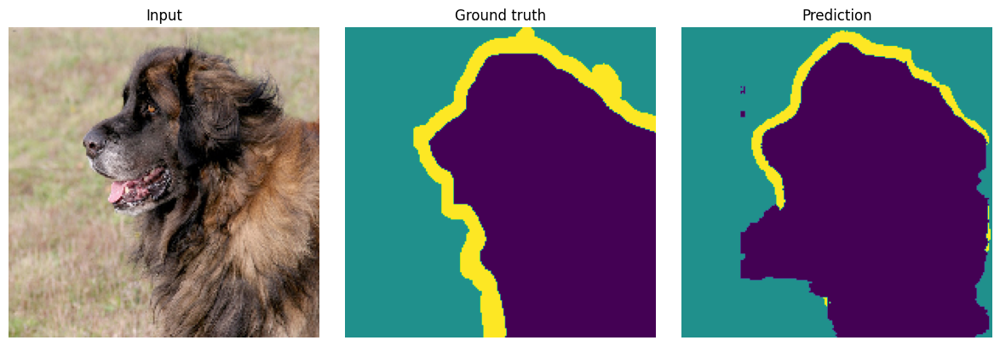

In [100]:
import matplotlib.pyplot as plt
from keras.utils import array_to_img

random_index = random.randrange(len(test_input_imgs))
test_image = test_input_imgs[random_index]
test_mask = test_targets[random_index]

pred_mask = seg_model.predict(np.expand_dims(test_image, axis=0))[0]
pred_mask = np.argmax(pred_mask, axis=-1)


def to_displayable(mask):
    if mask.ndim == 3:
        mask = mask[..., 0]
    mask = mask.astype("uint8") * 127
    return mask

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title("Input")
plt.axis("off")
plt.imshow(array_to_img(test_image))
plt.subplot(1, 3, 2)
plt.title("Ground truth")
plt.axis("off")
plt.imshow(to_displayable(test_mask), cmap="viridis")
plt.subplot(1, 3, 3)
plt.title("Prediction")
plt.axis("off")
plt.imshow(to_displayable(pred_mask), cmap="viridis")
plt.tight_layout()

